## Detect Animals in Images

In [ ]:
import cv2
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# model = YOLO("yolo11l.pt")
model = YOLO("yolo11x.pt")

In [ ]:
def predict(chosen_model, img, classes=[], conf=0.5):
    if classes:
        results = chosen_model.predict(img, classes=classes, conf=conf)
    else:
        results = chosen_model.predict(img, conf=conf)

    return results

def predict_and_detect(chosen_model, img, classes=[], conf=0.5, rectangle_thickness=2, text_thickness=1):
    results = predict(chosen_model, img, classes, conf=conf)
    for result in results:
        for box in result.boxes:
            cv2.rectangle(img, (int(box.xyxy[0][0]), int(box.xyxy[0][1])),
                          (int(box.xyxy[0][2]), int(box.xyxy[0][3])), (255, 0, 0), rectangle_thickness)
            cv2.putText(img, f"{result.names[int(box.cls[0])]}",
                        (int(box.xyxy[0][0]), int(box.xyxy[0][1]) - 10),
                        cv2.FONT_HERSHEY_PLAIN, 1, (255, 0, 0), text_thickness)
    return img, results


0: 448x640 1 cat, 2701.5ms
Speed: 4.3ms preprocess, 2701.5ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


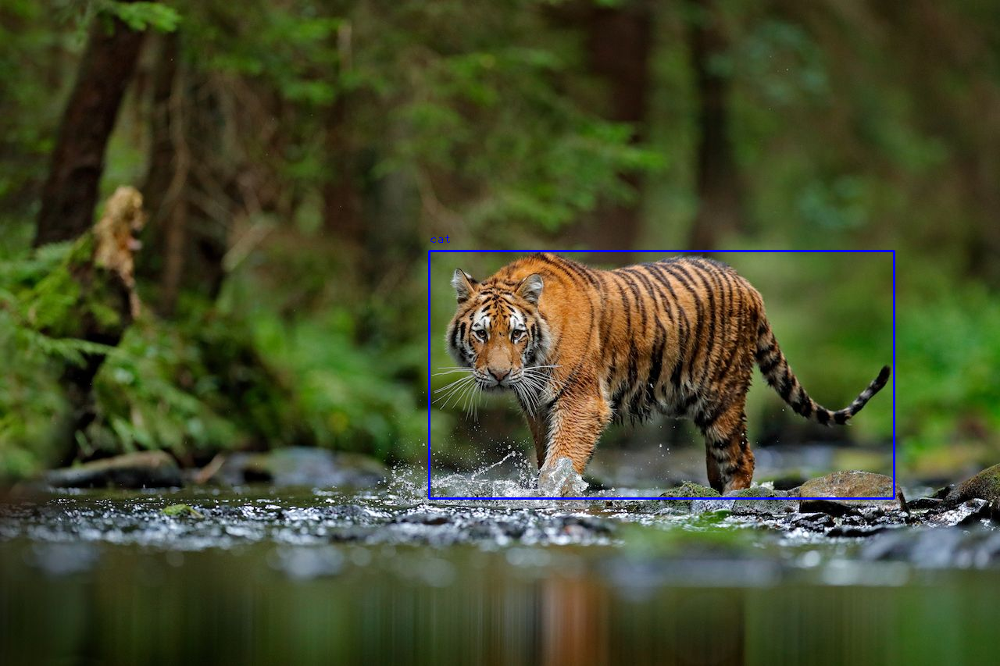

In [ ]:
# read the image

image = images_paths[0]
image = cv2.imread(image)
result_img, _ = predict_and_detect(model, image, classes=[], conf=0.5)

from google.colab.patches import cv2_imshow
import cv2

cv2_imshow(result_img)


0: 352x640 2 horses, 2278.7ms
Speed: 6.2ms preprocess, 2278.7ms inference, 1.3ms postprocess per image at shape (1, 3, 352, 640)


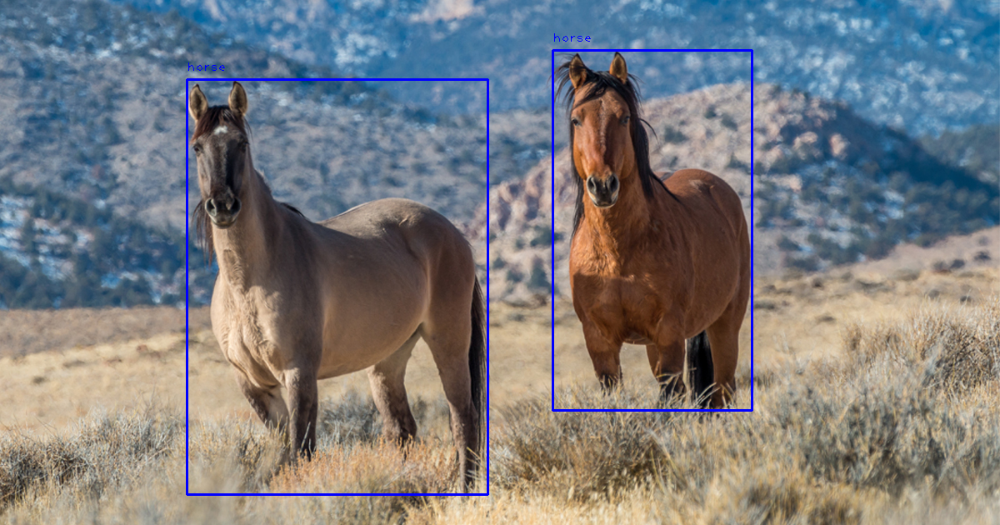

In [ ]:
image = images_paths[3]
image = cv2.imread(image)
result_img, _ = predict_and_detect(model, image, classes=[], conf=0.5)

cv2_imshow(result_img)

coco dataset has 80 classes

first it assigns to whatever class it thinks the image best fits
so tiger is assigned as cat

finetuning on new images will help it detect the proper class name, such as tiger

now we just need to detect it as animal.

the below figure has the list of classes from the coco dataset

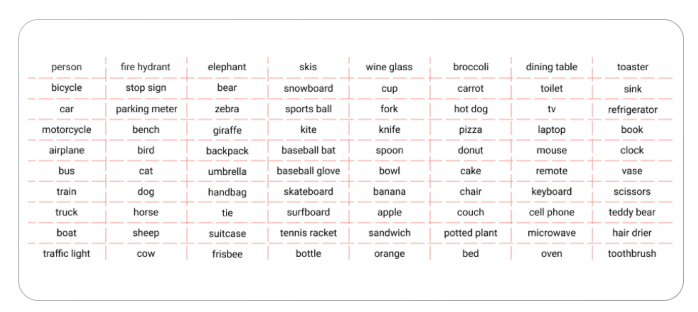

In [ ]:
import cv2

# Animal classes list in the COCO dataset
animal_classes = [
    "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe"
]

def predict(chosen_model, img, classes=[], conf=0.5):
    if classes:
        results = chosen_model.predict(img, classes=classes, conf=conf)
    else:
        results = chosen_model.predict(img, conf=conf)
    return results


def predict_and_detect(chosen_model, img, classes=[], conf=0.4, rectangle_thickness=2, text_thickness=2):
    results = predict(chosen_model, img, classes, conf=conf)

    for result in results:
        for box in result.boxes:

            # Get class ID
            class_id = int(box.cls[0])
            # Get class name
            class_name = result.names[class_id]

            # If detected class is in the animal list, label as "Animal", if not assign the default class name
            label = "Animal" if class_name in animal_classes else class_name

            # bounding box
            cv2.rectangle(img, (int(box.xyxy[0][0]), int(box.xyxy[0][1])),
                          (int(box.xyxy[0][2]), int(box.xyxy[0][3])),
                          (255, 0, 0), rectangle_thickness)

            # text label
            cv2.putText(img, label,
                        (int(box.xyxy[0][0]), int(box.xyxy[0][1]) - 10),
                        cv2.FONT_HERSHEY_PLAIN, 1, (255, 0, 0), text_thickness)

    return img, results



0: 448x640 1 cat, 3501.5ms
Speed: 18.9ms preprocess, 3501.5ms inference, 30.9ms postprocess per image at shape (1, 3, 448, 640)


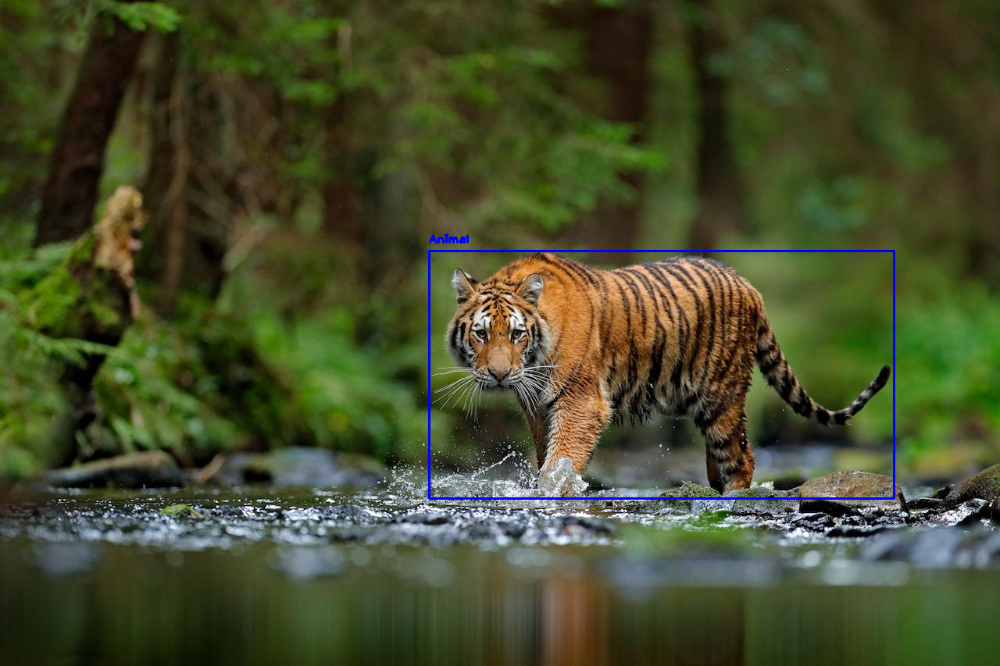


0: 448x640 2 sheeps, 2318.5ms
Speed: 4.4ms preprocess, 2318.5ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


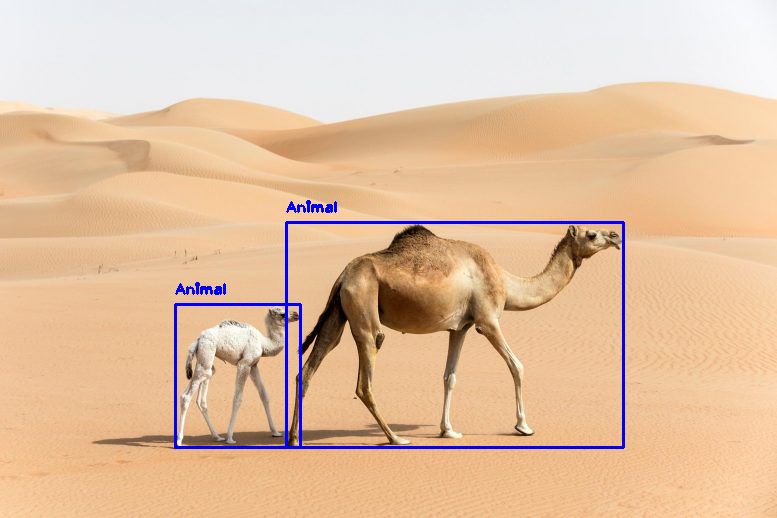


0: 448x640 1 cow, 2299.9ms
Speed: 5.0ms preprocess, 2299.9ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


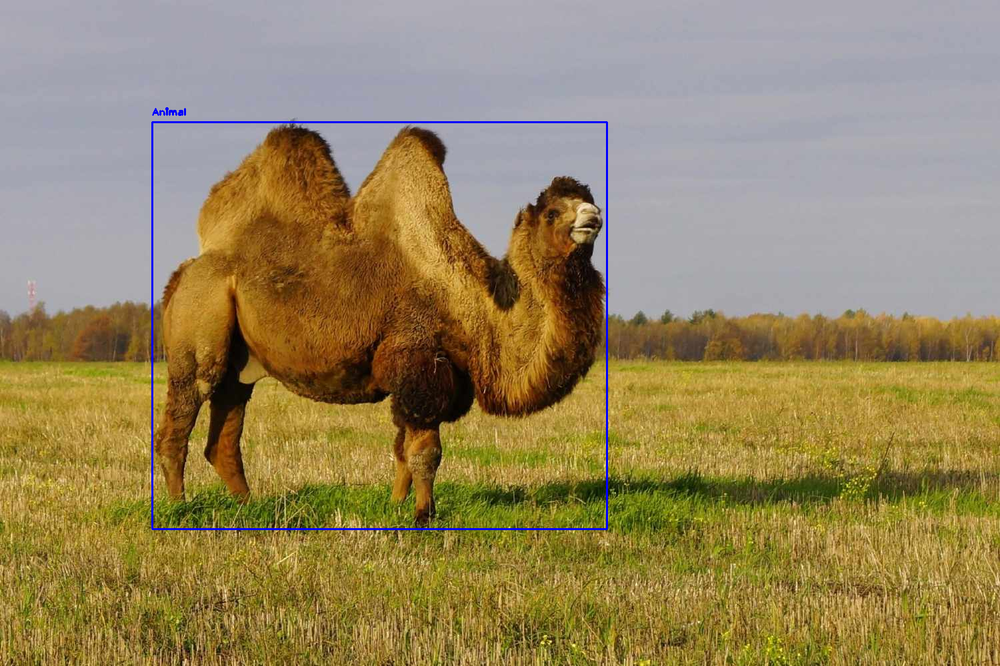


0: 352x640 2 horses, 1872.8ms
Speed: 4.8ms preprocess, 1872.8ms inference, 5.3ms postprocess per image at shape (1, 3, 352, 640)


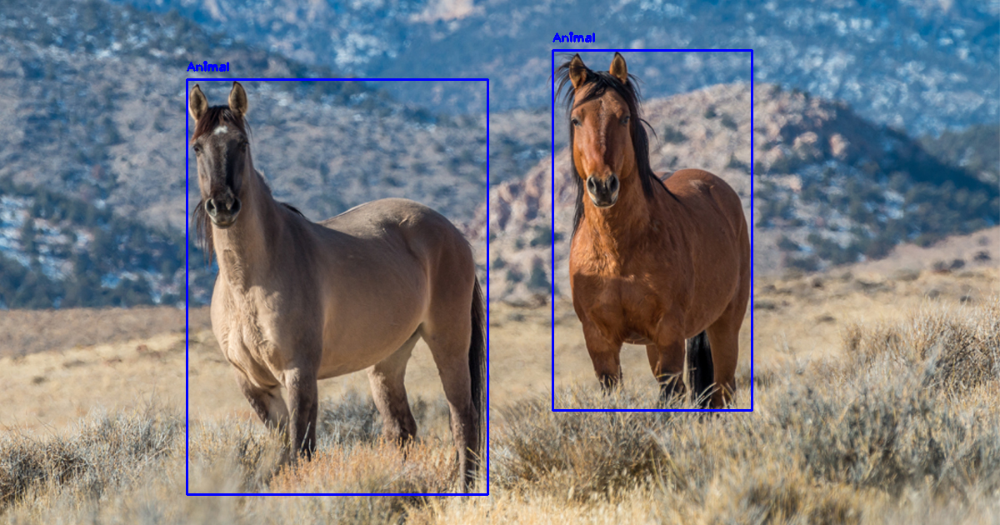


0: 416x640 1 dog, 3416.6ms
Speed: 7.5ms preprocess, 3416.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


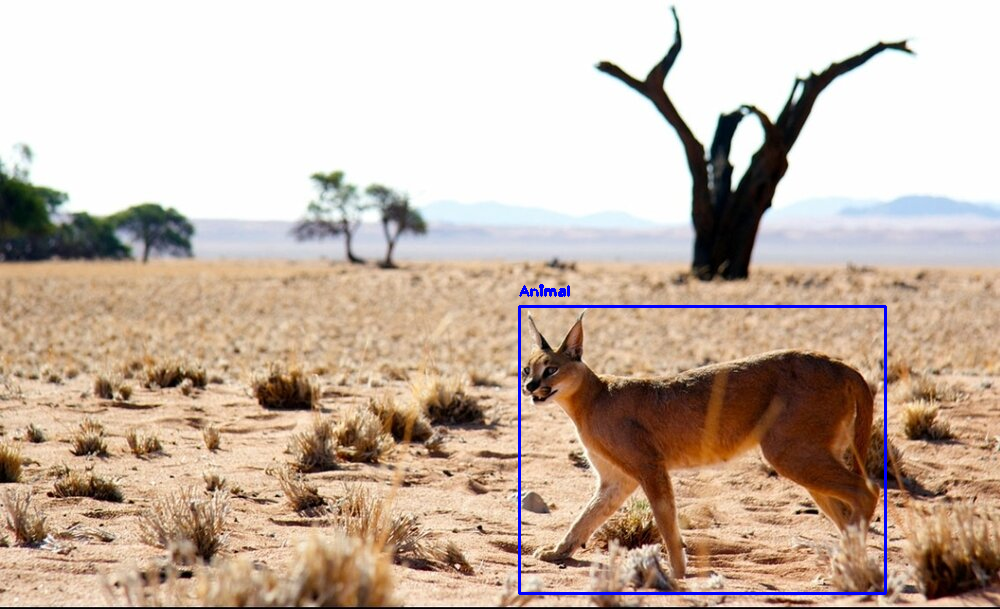


0: 384x640 2 horses, 2054.2ms
Speed: 4.3ms preprocess, 2054.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


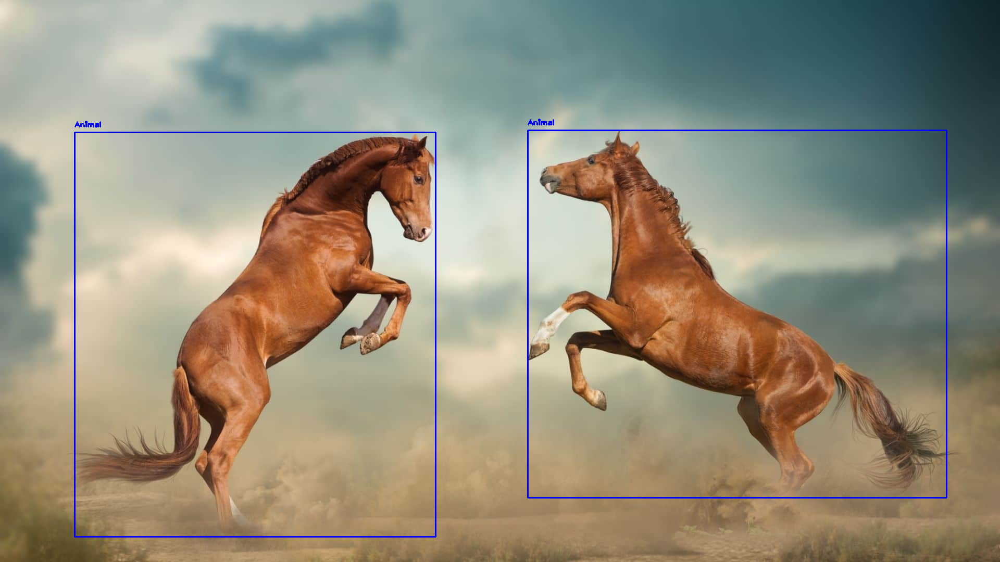

In [ ]:
for i in images_paths:

  # Read the image
  #image = images_paths[i]
  image = cv2.imread(i)

  # Run detection
  result_img, _ = predict_and_detect(model, image, conf=0.4)

  # Display the image
  cv2_imshow(result_img)